-------------------------------------------------------------------
**TD DSA 2021 de Antoine Ly   -   rapport de Fabien Faivre**
-------------------------     -------------------------------------

# Modélisation

## Setup

In [1]:
!pip install textblob

     |████████████████████████████████| 636 kB 16.9 MB/s eta 0:00:01


In [2]:
!pip install emot

In [3]:
!pip install wordcloud

     |████████████████████████████████| 371 kB 16.8 MB/s eta 0:00:01


In [34]:
!pip install lime

     |████████████████████████████████| 275 kB 22.0 MB/s eta 0:00:01
     |████████████████████████████████| 30.2 MB 29.9 MB/s eta 0:00:01
     |████████████████████████████████| 4.4 MB 90.2 MB/s eta 0:00:01
     |████████████████████████████████| 169 kB 92.7 MB/s eta 0:00:01
     |████████████████████████████████| 3.3 MB 92.8 MB/s eta 0:00:01
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283845 sha256=2a6f38ca2f18ebc0d1e34274390983b7dddd50365388186a9fd45b39d5676598
  Stored in directory: /root/.cache/pip/wheels/e6/a6/20/cc1e293fcdb67ede666fed293cb895395e7ecceb4467779546
Successfully built lime


In [1]:
#Temps et fichiers
import os
import warnings
import time
from datetime import timedelta

#Manipulation de données
import pandas as pd
import numpy as np


# Text
from collections import Counter
import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize
nltk.download('stopwords')
from nltk.corpus import stopwords
nltk.download('vader_lexicon')
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.stem import WordNetLemmatizer
nltk.download('wordnet')
from nltk.util import ngrams

from textblob import TextBlob
import string
import re
import spacy 
from emot.emo_unicode import UNICODE_EMO, EMOTICONS

#Modélisation
from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.base import BaseEstimator, TransformerMixin

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import TruncatedSVD

from sklearn.svm import LinearSVC
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier

from xgboost import XGBClassifier


#Evaluation
from sklearn.metrics import f1_score, confusion_matrix, classification_report, precision_score, recall_score


#Visualisation
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from wordcloud import WordCloud

#Tracking d'expérience
import mlflow
import mlflow.sklearn



[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [284]:
import shap

shap.initjs()


In [5]:
#Cellule strictement technique qui permet de sauver les exigences pour recréer au besoin l'image docker du projet
!pip freeze > /mnt/docker/requirements.txt

### Utilisation du package

Durent ce projet, certaines parties du code ont été re packagées dans un package propre au projet afin de factliter la lecture du core et permettre la réutilisabilité des développements

In [2]:
#Cette cellule permet d'appeler la version packagée du projet et d'en assurer le reload avant appel des fonctions
%load_ext autoreload
%autoreload 2

In [3]:
from dsa_sentiment.scripts.make_dataset import load_data
from dsa_sentiment.scripts.evaluate import eval_metrics
from dsa_sentiment.scripts.make_dataset import Preprocess_StrLower, Preprocess_transform_target

### Configuration de l'experiment MLFlow

[MLFlow](https://mlflow.org/) sera utilisé comme outil de suivi et de stockage des expérimentatiosn réalisées

In [7]:
mlflow.tracking.get_tracking_uri()

'/mnt/experiments'

### Chargement des données

In [4]:
# On Importe les données

#df
df_train=pd.read_parquet('/mnt/data/interim/df_train.gzip')
df_val=pd.read_parquet('/mnt/data/interim/df_val.gzip')
df_test=pd.read_parquet('/mnt/data/interim/df_test.gzip')

#X
X_train=pd.read_parquet('/mnt/data/interim/X_train.gzip')
X_val=pd.read_parquet('/mnt/data/interim/X_val.gzip')
X_test=pd.read_parquet('/mnt/data/interim/X_test.gzip')

X_train_prepro=pd.read_parquet('/mnt/data/interim/X_train_prepro.gzip')
X_val_prepro=pd.read_parquet('/mnt/data/interim/X_val_prepro.gzip')
X_test_prepro=pd.read_parquet('/mnt/data/interim/X_test_prepro.gzip')

#y
y_train=pd.read_parquet('/mnt/data/interim/y_train.gzip')
y_val=pd.read_parquet('/mnt/data/interim/y_val.gzip')
y_test=pd.read_parquet('/mnt/data/interim/y_test.gzip')

In [200]:
pd.options.display.max_colwidth=300

## Modélisation

### Création du code générique 

On commence par définir une fonction générique qui sera en capacité d'ajuster, optimiser et logger dans MLFlow les résultats de pipelines qui seront produits pour chaque essai

Le mode de fonctionnement souhaité consiste à 

1- définir un pipeline au sens de sklearn

2- utiliser une fonction générique pour ajuster le pipeline (éventuellement en optimisant les paramètres) et en stocker le résultat dans MLFlow

#### Préalables : création des fonctions de résultat souhaitées

La première étape consiste à construire une fonction générique qui calculera **les scores du pipeline que nous souhaitons suivre**.
Dans le cas présent comme l'exercice de classification est multiclasse, nous sommes intéressés par les `f1`, `precision` et `recall` calculés avec l'option `macro` qui réalise une moyenne des résultats obtenus par classe.

In [5]:
def score_estimator(
    estimator, X_train, X_test, df_train, df_test, target_col
):
    
    """
    Evalue un pipeline sur le jeu de train et test avec plusieurs métriques
    
    Ici les métriques utilisées sont :
    - f1 macro
    - precision macro
    - recall macro
    
    INPUTS :
        - estimator : un pipeline
        - X_train, X_test, df_train, df_test : les DataFrames contenant les jeux de données et test
        - target_col : le nom de la colonne cible dans les df
        
    OUTPUTS :
        - un DataFrame avec les métriques calculées sur les jeux de train et test fournis
    
    
    """

    metrics = [
        ("f1_macro", f1_score),   
        ("precision_macro", precision_score),
        ("recall_macro", recall_score),
        
    ]
    
    res = []
    for subset_label, X, df in [
        ("train", X_train, df_train),
        ("test", X_test, df_test),
    ]:
        y = df[target_col]
        y_pred = estimator.predict(X)
        for score_label, metric in metrics:
            score = metric(y, y_pred, average='macro')
            res.append(
                {"subset": subset_label, "metric": score_label, "score": score}
            )

    res = (
        pd.DataFrame(res)
        .set_index(["metric", "subset"])
        .score.unstack(-1)
        .round(4)
        .loc[:, ['train', 'test']]
    )
    return res

Pour pouvoir stocker les scores dans MLFlow, on les convertit en dictionnaires

In [6]:
def scores_to_dict(score_df):
    d = score_df['train'].to_dict()
    d1 = dict(zip([x+'_train_' for x in  list(d.keys())], list(d.values())))
    d = score_df['test'].to_dict()
    d2 = dict(zip([x+'_test' for x in  list(d.keys())], list(d.values())))
    d1.update(d2)
    return d1

Création d'une fonction affichant une matrice de confusion

In [7]:
def plot_cm(y_test, y_pred, target_names=[-1, 0, 1], 
            figsize=(5,3)):
    """Create a labelled confusion matrix plot."""
    cm = confusion_matrix(y_test, y_pred)
    fig, ax = plt.subplots(figsize=figsize)
    sns.heatmap(cm, annot=True, fmt='g', cmap='BuGn', cbar=False, 
                ax=ax)
    ax.set_title('Confusion matrix')
    ax.set_xlabel('Predicted')
    ax.set_xticklabels(target_names)
    ax.set_ylabel('Actual')
    ax.set_yticklabels(target_names, 
                       fontdict={'verticalalignment': 'center'});

#### Création de la fonction d'entraînement générique

La fonction suivante est celle qui sera systématiquement appélée pour entraîner les pipelines

:::{tip}
L'évaluation fianle des modèles se faisant sur base de f1-macro dans le TD, c'est la métrique que nous avons retenue pour la partie optimisation de la fonction générique
:::

In [8]:
def trainPipelineMlFlow(mlf_XP, 
                        xp_name_iter, 
                        pipeline, 
                        X_train, y_train, X_test, y_test, 
                        target_col='sentiment', 
                        fixed_params={}, 
                        use_opti=False, iterable_params={}, n_iter=20):
    """
    Fonction générique permettant d'entrainer et d'optimiser un pipeline sklearn
    Les paramètres et résultats sont stockés dans MLFlow
    
    INPUTS:
        - mlf_XP : nom de l'experiment à créer dans MLFlow
        - xp_name_iter : nom du run créé dans l'experiment de MLFlow
        - pipeline : un pipeline au sens ed sklearn
        - X_train, y_train, X_test, y_test : des dataframes contenant les jeux d'entrainement et de test
        - target_col : le nom de la colonne du DataFrame y qui constitue la cible
        - fixed_params : un dictionnaire contenant les paramètres fixes dont l'utilisateur souhaite fixer la valeur dans le pipeline
        - use_opti : boolean, est-ce qu'une optimisation est recherchée. Si oui, utilisera RandomizedSearchCV
        - iterable_params : un dictionnaire contenant les nom des paramètres ciblés du pipeline et des listes contenant les valeusr possibles
        - n_iter : le nombre d'itérations maximales à réaliser par RandomizedSearchCV
    
    FONCTIONNEMENT:
        stocke dans MLFlow :
        - le pipeline entrainé
        - les principaux paramètres correspondant aux paramètres fixes et aux éventuels paramètres optimaux après RandomizedSearchCV
        - les scores (scalaires) calculés par la fonction score_estimator
        - le temps d'exécution
        
        imprime :
        - le nom de l'experiment
        - le pipeline entraîné
        - les paramètres principaux (cf FONCTIONNEMENT)
        - la matrice de confusion du pipeline sur le jeu de test fourni en entrée
    
    OUTPUTS:
        - le pipeline entraîné
    
       
    """
  
    mlflow.set_experiment(mlf_XP)

    with mlflow.start_run(run_name=xp_name_iter):
        
        start_time = time.monotonic()  
        
        warnings.filterwarnings("ignore")
        
        # fit pipeline
        pipeline.set_params(**fixed_params)
        if not use_opti:
            search = pipeline
        else:
            search = RandomizedSearchCV(estimator = pipeline, 
                                        param_distributions = iterable_params, 
                                        n_jobs = -1, 
                                        cv = 5, 
                                        scoring = 'f1_macro', 
                                        n_iter = n_iter,
                                        random_state = 42
                                       )
        
        search.fit(X_train, y_train[target_col])
                
        # get params
        params_to_log = fixed_params #select initial params
        if use_opti:
            params_to_log.update(search.best_params_) #update for optimal solution
        mlflow.log_params(params_to_log)
        
        # Evaluate metrics
        y_pred=search.predict(X_test)
        score = score_estimator(estimator=search, 
                                         X_train=X_train, 
                                         X_test=X_test, 
                                         df_train=y_train, 
                                         df_test=y_test, 
                                         target_col=target_col
                                )
        
        # Print out metrics
        print('XP :', xp_name_iter, '\n')
        print('pipeline : \n', search, '\n')
        print("params: \n", params_to_log, '\n')
        print('scores : \n', score, '\n')
        print("Test confusion matrix: \n")
        plot_cm(y_test, search.predict(X_test))
        
        
        #r Report to MlFlow
        mlflow.log_metrics(scores_to_dict(score))
        mlflow.sklearn.log_model(pipeline, xp_name_iter)
        
        end_time = time.monotonic()
        elapsed_time = timedelta(seconds=end_time - start_time)
        print('elapsed time :', elapsed_time)
        mlflow.set_tag(key="elapsed_time", value=elapsed_time)   
        
        
        
    return search;
        

#### Utilitaires : pour faciliter l'utilisation des pipelines

Si les pipelines permettent un traitement souple et homogène entre les jeux de données, leur manipulation n'est pas évidente.
Notamment, le libellé des paramètres peut vide devenir délicat et difficilement lisible avec une combinaison de nom d'étape et du nom du paramètre dans l'étape du pipeline.
La fonction suivante permet de rechercher tous les paramètres d'un pipeline qui contiennent une chaine de caractère spécifique.

In [9]:
def target_params(pipe, dict_keyval):
    """
    Crée un dictionnaire constitué de tous les paramètres incluant 'pattern' d'un pipe et leur assigne une valeur unique
    """
    
    res={}
    for key in list(dict_keyval.keys()):
    
        target = "[a-zA-Z\_]+__" + key

        rs = re.findall(target, ' '.join(list(pipe.get_params().keys())))
        rs=dict.fromkeys(rs, dict_keyval[key])
        res.update(rs)
    return res

#### Utilitaires : Adaptation des pipelines

La cellule suivante permet de créer des étapes de sélection de colonnes dans les Data Frame en entrée

In [151]:
from sklearn.base import BaseEstimator, TransformerMixin

class TextSelector(BaseEstimator, TransformerMixin):
    def __init__(self, field):
        self.field = field
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        if isinstance(X,(list,pd.core.series.Series,np.ndarray)): #permet d'avoir une structure souple si l'input n'est pas un DataFrame. Permet notamment d'utiliser LIME
            return X
        else:
            return X[self.field]


#### Utilitaires : Visualisation

In [159]:
def plotWc(text, stopwords=None, title=''):
    wc = WordCloud(
            stopwords=stopwords,
            width=800,
            height=400,
            max_words=1000,
            random_state=44,
            background_color="white",
            collocations=False
    ).generate(text)
    
    plt.figure(figsize = (10,10))
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title(title)
    plt.show()

### Approche initiale

On commence par construire un modèle simple qui nous servira de modèle de base que nous chercherons à améliorer.

:::{warning}

Dans cette première étape, nous travaillerons sur le jeu `train` que nous avons découpé et évaluerons ses performances sur le jeu `val`.

Seuls les principaux modèles seront réentrainés sur `{ train + val }` avant d'être évalués sur le véritable jeu `test`

:::

On suit les modèles dans un DataFrame résultats

In [219]:
résultats = pd.DataFrame(columns=['modèle', 'f1_macro_val'])
résultats

,modèle,f1_macro_val


#### Bag of Words avec Random Forest

Dans cette expérimentation, nous créons un modèle simple :

![BoW_RF](images/Pipeline_BoW_RF.png)

La classe `TfidfVectorizer` de sklearn permet d'appliquer ou non le traitement TF-IDF et dans ce dernier cas de travailler directement avec un Bag of Words 

In [153]:
tfidf_RF_pipeline = Pipeline(
    steps=[
        ('coltext', TextSelector('text')),
        ("tfidf", TfidfVectorizer()),
        ("classifier", RandomForestClassifier(n_jobs=-1)),
    ]
)


Déjà dans cet exemple simple, le nombre de paramètres est important et leur nom vite complexe :

In [154]:
list(tfidf_RF_pipeline.get_params().keys())

['memory',
 'steps',
 'verbose',
 'coltext',
 'tfidf',
 'classifier',
 'coltext__field',
 'tfidf__analyzer',
 'tfidf__binary',
 'tfidf__decode_error',
 'tfidf__dtype',
 'tfidf__encoding',
 'tfidf__input',
 'tfidf__lowercase',
 'tfidf__max_df',
 'tfidf__max_features',
 'tfidf__min_df',
 'tfidf__ngram_range',
 'tfidf__norm',
 'tfidf__preprocessor',
 'tfidf__smooth_idf',
 'tfidf__stop_words',
 'tfidf__strip_accents',
 'tfidf__sublinear_tf',
 'tfidf__token_pattern',
 'tfidf__tokenizer',
 'tfidf__use_idf',
 'tfidf__vocabulary',
 'classifier__bootstrap',
 'classifier__ccp_alpha',
 'classifier__class_weight',
 'classifier__criterion',
 'classifier__max_depth',
 'classifier__max_features',
 'classifier__max_leaf_nodes',
 'classifier__max_samples',
 'classifier__min_impurity_decrease',
 'classifier__min_impurity_split',
 'classifier__min_samples_leaf',
 'classifier__min_samples_split',
 'classifier__min_weight_fraction_leaf',
 'classifier__n_estimators',
 'classifier__n_jobs',
 'classifier__oob

En première intention on ajuste le pipeline sur le jeu d'entraînement avant les étapes de preprocessing réalisées lors de l'EDA

XP : base_tfidf_RF 

pipeline : 
 Pipeline(steps=[('coltext', TextSelector(field='text')),
                ('tfidf', TfidfVectorizer(use_idf=False)),
                ('classifier',
                 RandomForestClassifier(n_jobs=-1, random_state=42))]) 

params: 
 {'classifier__n_jobs': -1, 'classifier__random_state': 42} 

scores : 
 subset            train    test
metric                         
f1_macro         0.9991  0.6781
precision_macro  0.9991  0.7071
recall_macro     0.9991  0.6676 

Test confusion matrix: 

elapsed time : 0:00:03.469991


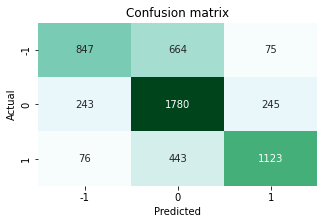

In [304]:
pipe = tfidf_RF_pipeline


base_tfidf_RF_= trainPipelineMlFlow(
                    mlf_XP = "Rapport",
                    xp_name_iter = "base_tfidf_RF", 
                    pipeline = pipe, 
                    X_train = X_train, y_train = y_train, X_test = X_val, y_test = y_val,
                    target_col = 'sentiment',
                    fixed_params = target_params( pipe , {'n_jobs':-1, 'random_state':42})
                    );

Le modèle de base produit un f1 macro de **67,81%** sur le jeu de validation avec le paramétrage par défaut de sklearn.
On observe le très fort f1 macro sur le jeu d'entraînement qui indique un fort surapprentissage.
L'intérêt de ce pipeline est d'être très rapide à l'entraînement (à peine plus de 3 secondes ici)

On voit bien que la difficulté viendra de la classe neutre qui peut facilement être confondue avec les classes négatives ou positives

Par contre, il est plus surprenant de voir des tweets positifs classés en négatifs et inversement.

La suite investigue ce phénomène

In [305]:
pipe = base_TfIdf_RF_

y_val_pred = pipe.predict(X_val)

exemples_realNeg_predPos = X_val[(y_val['sentiment']==-1) & (y_val_pred==1)]
exemples_realPos_predNeg = X_val[(y_val['sentiment']==1) & (y_val_pred==-1)]

##### Analyse des tweets négatifs classé positifs

In [306]:
exemples_realNeg_predPos

,text
22050,oo noo thats not good
22195,Legs are hurting because I was standing up all day.
22218,Is beastypops tired? I wish i was. My tablets are just making me want to throw up!
22278,"BAH, you`be made me all hungry now"
22349,just tried DMing you but it tried to download some strange file so stopped! How come no gmail MaccyM? Missing you SADS!!
...,...
27195,i wish i could but it would cost too much to call you all the way from the UK
27219,I can`t believe you tweeted that. It was our special moment
27329,"unfortunetly no I wish, I mean sometimes like twice a yr they`ll have a party, but not always"
27364,"I bet you received lots of hit from that tweet; at work i cannot, wish i could"


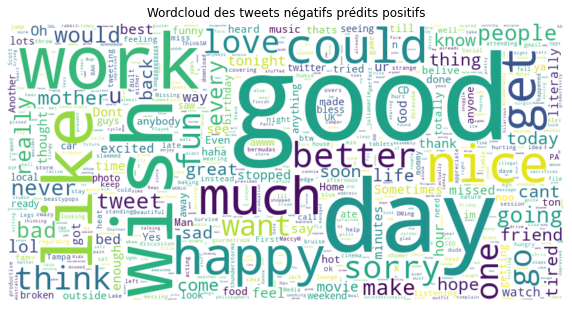

In [307]:
plotWc(" ".join(exemples_realNeg_predPos['text']), stopwords=stopwords.words('english'), title = "Wordcloud des tweets négatifs prédits positifs")

On voit les limites des approches de type Bag of Words : le modèle est trompé par des mots à connotation positive sans en comprendre l'enchaînement

##### Analyse des tweets positifs classé négatifs

In [308]:
exemples_realPos_predNeg

,text
22078,dont worry im not!!! i dont get it on my tv
22165,Bummer I know LOL I actually do more partying when i am in school then out of school..I think it somehow helps me..hahaha!
22281,_22 ok so I`m having a complete insomniac moment. It`s 6am(almost) and I`m STILL awake. I hate when I can`t stop thinking! mornin!
22319,OMG I`M SOO EXCITED! i`ve been waiting for it ever since i saw the 5th one at midnight the night before!
22630,"let me guess ... ran a few miles? Respect dude, I can`t do it. Maybe you should train me"
22636,I`m gonna havta temp stop fllwing u while ur talkin abt kobe bc I loveeeeeeee him & I`m taking it personal and I like lebron 2.
23235,"That poor girl on britains got talent, god love her forgot the words and cried but gets a second chance to perform again : ]"
23259,"Gmorning ooh giirll, Mondays"
23499,Chilling feeling really nice..
23500,"Hey, nothing wrong with that!"


On observe deux phénomènes contraires :
- vraisemblablement des problèmes de labelisation (ex 22281 classé positifs...)
- des tweets manifestements positifs sans pièges et pourtant classés négatifs (25367)

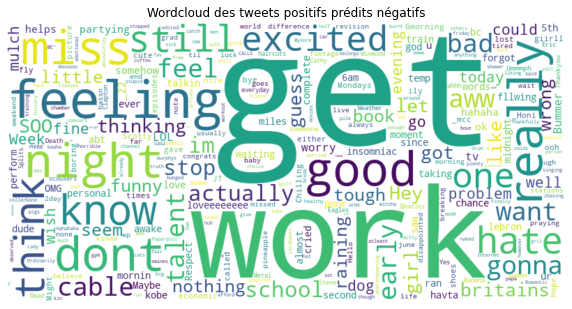

In [299]:
plotWc(" ".join(exemples_realPos_predNeg['text']), stopwords=stopwords.words('english'), title = "Wordcloud des tweets positifs prédits négatifs")

pour essayer de comprendre ce qu'il s'est passé sur l'instance 25367, on peut essayer d'analyser le résultat à partir de Lime :

In [309]:
exemples_realPos_predNeg['text'][25367]

"I really like Lady GaGa`s 'Paparazzi'...  #whatshappening"

In [310]:
from lime import lime_text
from lime.lime_text import LimeTextExplainer
explainer = LimeTextExplainer(class_names=['negative', 'neutral', 'positive'])

exp = explainer.explain_instance(exemples_realPos_predNeg['text'][25367], base_TfIdf_RF_.predict_proba, top_labels=1)
exp.show_in_notebook(text=True)


Le résultat est très surprenant. On peut imaginer que really est utilisé plus frequemment dans des tweets négatifs

In [311]:
def list_words_with(text_series, search='', nb=30):
    '''
    Cette fonction permet de lister les mots dans un string qui contiennent une certaine chaîne de caractères
    
    inputs :
        - text_series : un pd.Series contennat les chaînes de caractères
        - search : la séquence à rechercher
        - nb : ressortir les nb occurences les plus fréquentes
    
    output :
        - une liste de tuples contenant 
            + le mot contenant la séquence recherchée
            + le nombre d'occurence dans text_series
    
    '''
    
    
    #searchPattern   = f"\w*{search}\w*"
    searchPattern   = f"\w*{search}\w* "
    
    cnt = Counter()
    
    for tweet in text_series:
        # Replace all URls with 'URL'
        tweet = re.findall(searchPattern,tweet)
        for word in tweet:
            cnt[word] += 1
    return cnt.most_common(nb)
    

In [312]:
list_words_with(X_train['text'][y_train['sentiment']==-1], 'really')

[('really ', 240), ('reallyreally ', 1), ('reallyyyyy ', 1), ('reallyy ', 1)]

In [313]:
list_words_with(X_train['text'][y_train['sentiment']==1], 'really')

[('really ', 202)]

Ce qui est bien le cas

In [220]:
item = pd.DataFrame([['base_TfIdf_RF_', f1_score(y_val, base_TfIdf_RF_.predict(X_val),average='macro')]], columns=['modèle', 'f1_macro_val'])

item

,modèle,f1_macro_val
0,base_TfIdf_RF_,0.669789


In [221]:
résultats = résultats.append(item)
résultats

,modèle,f1_macro_val
0,base_TfIdf_RF_,0.669789


#### variante preprocessing

On peut juger de l'intérêt des prétraitements que nous avons réalisés en changeant le jeu d'entrée :

![RF_prepro](images/Pipeline_BoW_RF_prepro.png)

XP : base_TfIdf_RF_prepro 

pipeline : 
 Pipeline(steps=[('coltext', TextSelector(field='text')),
                ('tfidf', TfidfVectorizer(use_idf=False)),
                ('classifier',
                 RandomForestClassifier(n_jobs=-1, random_state=42))]) 

params: 
 {'classifier__n_jobs': -1, 'classifier__random_state': 42} 

scores : 
 subset            train    test
metric                         
f1_macro         0.9974  0.7079
precision_macro  0.9975  0.7208
recall_macro     0.9973  0.7028 

Test confusion matrix: 

elapsed time : 0:00:03.568283


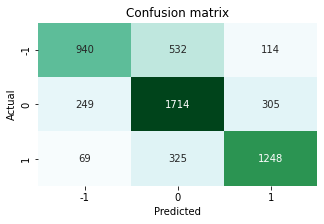

In [216]:
pipe = tfidf_RF_pipeline


base_TfIdf_RF_prepro_= trainPipelineMlFlow(
                            mlf_XP = "Rapport",
                            xp_name_iter = "base_TfIdf_RF_prepro", 
                            pipeline = pipe, 
                            X_train = X_train_prepro, y_train = y_train, X_test = X_val_prepro, y_test = y_val,
                            target_col = 'sentiment',
                            fixed_params = target_params( pipe , {'n_jobs':-1, 'random_state':42})
                        );

:::{admonition} apport du preprocessing
On observe tout de suite l'apport des retraitemenst effectués à l'étape EDA : le modèle est passé à une performance de **70,79%** sur le jeu de validation sans autres modifications
:::

In [222]:
item = pd.DataFrame([['base_TfIdf_RF_prepro_', f1_score(y_val, base_TfIdf_RF_prepro_.predict(X_val_prepro),average='macro')]], columns=['modèle', 'f1_macro_val'])

item

,modèle,f1_macro_val
0,base_TfIdf_RF_prepro_,0.707919


In [223]:
résultats = résultats.append(item)
résultats

,modèle,f1_macro_val
0,base_TfIdf_RF_,0.669789
0,base_TfIdf_RF_prepro_,0.707919


#### variante optimisée

Une autre variante consiste à essayer d'ajuster les hyper paramètres du pipeline dans l'espoire de gagner en performance.
On reste sur le jeu de données prétraité

XP : base_TfIdf_RF_prepro_opti 

pipeline : 
 RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('coltext',
                                              TextSelector(field='text')),
                                             ('tfidf',
                                              TfidfVectorizer(use_idf=False)),
                                             ('classifier',
                                              RandomForestClassifier(n_jobs=-1,
                                                                     random_state=42))]),
                   n_iter=30, n_jobs=-1,
                   param_distributions={'classifier__bootstrap': [True, False],
                                        'classifier__class_weight': ['balanced',
                                                                     None],
                                        'classifier__n_estimators': [100, 300,
                                                                     500],
 

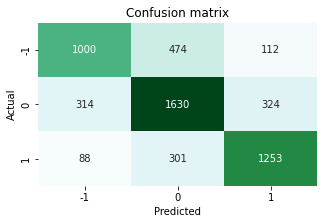

In [225]:
pipe = tfidf_RF_pipeline


params = target_params( pipe , {
                                "use_idf": [True, False],
                                "ngram_range": [(1, 1), (1, 2), (1,3)],
                                "bootstrap": [True, False],
                                "class_weight": ["balanced", None],
                                "n_estimators": [100, 300, 500],
                                })


base_TfIdf_RF_prepro_opti_= trainPipelineMlFlow(
                                            mlf_XP = "Rapport",
                                            xp_name_iter = "base_TfIdf_RF_prepro_opti", 
                                            pipeline = pipe, 
                                            X_train = X_train_prepro, y_train = y_train, X_test = X_val_prepro, y_test = y_val,
                                            target_col = 'sentiment',
                                            fixed_params = target_params( pipe , {'n_jobs':-1, 'random_state':42}),
                                            use_opti = True,
                                            iterable_params = params,
                                            n_iter = 30
                                      );

L'optimisation a eu ici un impact négatif très faible : f1 macro de **70,64%** sur le jeu de validation, soit **-0,15%** , pour un temps de calcul démultiplié (55min vs 3sec)

In [226]:
item = pd.DataFrame([['base_TfIdf_RF_prepro_opti_', f1_score(y_val, base_TfIdf_RF_prepro_opti_.predict(X_val_prepro),average='macro')]], columns=['modèle', 'f1_macro_val'])

item

,modèle,f1_macro_val
0,base_TfIdf_RF_prepro_opti_,0.706432


In [227]:
résultats = résultats.append(item)
résultats

,modèle,f1_macro_val
0,base_TfIdf_RF_,0.669789
0,base_TfIdf_RF_prepro_,0.707919
0,base_TfIdf_RF_prepro_opti_,0.706432


#### Bag of Words avec régression logistique

Une autre variante : on essaie un autre classifier, la régression logistique

![bow_pipeline_LR](images/Pipeline_BoW_LR_prepro.png)


In [228]:
tfidf_LR_pipeline = Pipeline(
    steps=[
        ('coltext', TextSelector('text')), 
        ("tfidf", TfidfVectorizer()),
        ("classifier", LogisticRegression(solver='liblinear', multi_class='auto')),
    ]
)

In [229]:
list(bow_pipeline_LR.get_params().keys())

['memory',
 'steps',
 'verbose',
 'coltext',
 'tfidf',
 'classifier',
 'coltext__field',
 'tfidf__analyzer',
 'tfidf__binary',
 'tfidf__decode_error',
 'tfidf__dtype',
 'tfidf__encoding',
 'tfidf__input',
 'tfidf__lowercase',
 'tfidf__max_df',
 'tfidf__max_features',
 'tfidf__min_df',
 'tfidf__ngram_range',
 'tfidf__norm',
 'tfidf__preprocessor',
 'tfidf__smooth_idf',
 'tfidf__stop_words',
 'tfidf__strip_accents',
 'tfidf__sublinear_tf',
 'tfidf__token_pattern',
 'tfidf__tokenizer',
 'tfidf__use_idf',
 'tfidf__vocabulary',
 'classifier__C',
 'classifier__class_weight',
 'classifier__dual',
 'classifier__fit_intercept',
 'classifier__intercept_scaling',
 'classifier__l1_ratio',
 'classifier__max_iter',
 'classifier__multi_class',
 'classifier__n_jobs',
 'classifier__penalty',
 'classifier__random_state',
 'classifier__solver',
 'classifier__tol',
 'classifier__verbose',
 'classifier__warm_start']

XP : TfIdf_LR_prepro_opti 

pipeline : 
 RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('coltext',
                                              TextSelector(field='text')),
                                             ('tfidf', TfidfVectorizer()),
                                             ('classifier',
                                              LogisticRegression(n_jobs=-1,
                                                                 random_state=42,
                                                                 solver='liblinear'))]),
                   n_iter=30, n_jobs=-1,
                   param_distributions={'classifier__class_weight': [None,
                                                                     'balanced'],
                                        'tfidf__ngram_range': [(1, 1), (1, 2),
                                                               (1, 3)],
                                        'tfidf__use_idf': [True, False]

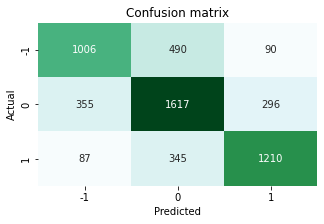

In [230]:
pipe = tfidf_LR_pipeline


params = target_params( pipe , {
                                "use_idf": [True, False],
                                "ngram_range": [(1, 1), (1, 2), (1,3)],
                                "class_weight": [None, 'balanced']
                                })    

TfIdf_LR_prepro_opti_ = trainPipelineMlFlow(
                                mlf_XP = "Rapport",
                                xp_name_iter = "TfIdf_LR_prepro_opti", 
                                pipeline = pipe, 
                                X_train = X_train_prepro, y_train = y_train, X_test = X_val_prepro, y_test = y_val,
                                target_col = 'sentiment',
                                fixed_params = target_params(pipe, {'n_jobs':-1,'random_state':42}),
                                use_opti = True,
                                iterable_params = params,
                                n_iter=30
                                );

Le classifier LogisticRegression avec les données retraitées performe moins bien que le RandomForest (**69,86%** sur le jeu de validation).

In [231]:
item = pd.DataFrame([['TfIdf_LR_prepro_opti_', f1_score(y_val, TfIdf_LR_prepro_opti_.predict(X_val_prepro),average='macro')]], columns=['modèle', 'f1_macro_val'])

item

,modèle,f1_macro_val
0,TfIdf_LR_prepro_opti_,0.698565


In [232]:
résultats = résultats.append(item)
résultats

,modèle,f1_macro_val
0,base_TfIdf_RF_,0.669789
0,base_TfIdf_RF_prepro_,0.707919
0,base_TfIdf_RF_prepro_opti_,0.706432
0,TfIdf_LR_prepro_opti_,0.698565


Afin de vérifier si les données retraitées apprortent quelque chose on relance le même pipeline avec les jeux d'origine

XP : TfIdf_LR_opti 

pipeline : 
 RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('coltext',
                                              TextSelector(field='text')),
                                             ('tfidf', TfidfVectorizer()),
                                             ('classifier',
                                              LogisticRegression(n_jobs=-1,
                                                                 random_state=42,
                                                                 solver='liblinear'))]),
                   n_iter=30, n_jobs=-1,
                   param_distributions={'classifier__class_weight': [None,
                                                                     'balanced'],
                                        'tfidf__ngram_range': [(1, 1), (1, 2),
                                                               (1, 3)],
                                        'tfidf__use_idf': [True, False]},
    

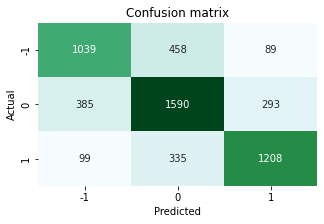

In [233]:
pipe = tfidf_LR_pipeline


params = target_params( pipe , {
                                "use_idf": [True, False],
                                "ngram_range": [(1, 1), (1, 2), (1,3)],
                                "class_weight": [None, 'balanced']
                                })    

TfIdf_LR_opti_ = trainPipelineMlFlow(
                        mlf_XP = "Rapport",
                        xp_name_iter = "TfIdf_LR_opti", 
                        pipeline = pipe, 
                        X_train = X_train, y_train = y_train, X_test = X_val, y_test = y_val,
                        target_col = 'sentiment',
                        fixed_params = target_params(pipe, {'n_jobs':-1,'random_state':42}),
                        use_opti = True,
                        iterable_params = params,
                        n_iter=30
                        );

On observe un comportement différent avec la régression logistice. Dans ce cas, c'est l'utilisation du jeu d'origine (avec le tokeniser par défaut de Tf Idf) qui apport de meilleurs résultats (**69,99%** sur le jeu de validation), sans toutefois égaler les performances du RandomForest

In [234]:
item = pd.DataFrame([['TfIdf_LR_opti_', f1_score(y_val, TfIdf_LR_opti_.predict(X_val),average='macro')]], columns=['modèle', 'f1_macro_val'])

item

,modèle,f1_macro_val
0,TfIdf_LR_opti_,0.699877


In [235]:
résultats = résultats.append(item)
résultats

,modèle,f1_macro_val
0,base_TfIdf_RF_,0.669789
0,base_TfIdf_RF_prepro_,0.707919
0,base_TfIdf_RF_prepro_opti_,0.706432
0,TfIdf_LR_prepro_opti_,0.698565
0,TfIdf_LR_opti_,0.699877


Ainsi les méthodes classiques nous aurons permi de gagner 3 points de f1 macro, le leader actuel étant le modèle RandomForest avec un simple BagOfWords (TfIdf=False) et optimisé dans ses paramètres sur le jeu de données prétraité.

In [236]:
résultats_trié = résultats.sort_values(by='f1_macro_val',ascending=False)
résultats_trié

,modèle,f1_macro_val
0,base_TfIdf_RF_prepro_,0.707919
0,base_TfIdf_RF_prepro_opti_,0.706432
0,TfIdf_LR_opti_,0.699877
0,TfIdf_LR_prepro_opti_,0.698565
0,base_TfIdf_RF_,0.669789


#### Optimisation du seuil de décision pour maximiser le f1

On peut aussi tirer avantage de la métrique utilisée pour l'évaluation. En effet, parmi les 3 catégories recherchées (`negative`, `neutral` et `positive`) il existe une gradation et en définitive, on est surtout intéressés à déterminer qsi un commentaire est positif ou négatif. La classification neutre étant une catégorie "par défaut" sans marqueur fort. 

Stratégie : on maximise sur le jeu d'entraînement le seuil pour la décision positive, puis sur les non positifs, on maximise le seuil pour les négatifs, le reste est neutre

In [237]:
# permet de prendre une décision à partir d'un seuil
def to_labels(pos_probs, threshold):
    return (pos_probs >= threshold).astype('int')

In [238]:
def find_optimal_f1_thresholds(pipe, X, y):
    
    probs = pipe.predict_proba(X)
    
    # On commence par travailler les prédictions positives
    pos_probs = probs[:,2]
    # On définit une échelle de seuils
    thresholds = np.arange(0, 1, 0.001)
    # On évalue le f1 pour chaque seuil
    scores = [f1_score([(1 if i==1 else 0) for i in y ], to_labels(pos_probs, t)) for t in thresholds]
    # On récupère le seuil optimal pour la catégorie positive
    ix = np.argmax(scores)

    
    res = {'pos_threshold' : thresholds[ix], 'pos_f1' : scores[ix] }
    
    # On continue avec les prédictions négatives
    neg_probs = probs[:,0]
    # On définit une échelle de seuils
    thresholds = np.arange(0, 1, 0.001)
    # On évalue le f1 pour chaque seuil
    scores = [f1_score([(1 if i==-1 else 0) for i in y ], to_labels(neg_probs, t)) for t in thresholds]
    # On récupère le seuil optimal pour la catégorie positive
    ix = np.argmax(scores)

    
    res.update({'neg_threshold' : thresholds[ix], 'neg_f1' : scores[ix] })
    
    return res
    

In [239]:
# startégie : on commence par décider si positif,
# sur les non positifs

def sentiment_predict(pipe, X, dict_thres):
    '''
    stratégie :  on commence par décider si positif,
                 sur les non positifs, on décide si négatifs,
                 les restants sont neutres
    '''
    
    
    
    seuil_pos=dict_thres['pos_threshold']
    seuil_neg=dict_thres['neg_threshold']

    probs = pipe.predict_proba(X)

    y_test_pred_pos = to_labels(probs[:,2], seuil_pos)
    y_test_pred_neg = to_labels(probs[:,0], seuil_neg)

    y_test_pred = y_test_pred_pos
    y_test_pred[(y_test_pred_pos==0)] = -y_test_pred_neg[(y_test_pred_pos==0)]
    return y_test_pred

In [240]:
thres = find_optimal_f1_thresholds(base_TfIdf_RF_prepro_opti_, X_train_prepro, y_train['sentiment'])

In [241]:
thres

{'pos_threshold': 0.39,
 'pos_f1': 0.997985031663788,
 'neg_threshold': 0.417,
 'neg_f1': 0.9969359780680535}

In [242]:
y_val_pred = sentiment_predict(base_TfIdf_RF_prepro_opti_, X_val_prepro,thres)

In [243]:
f1_score(y_val, y_val_pred, average='macro')

0.7094767083062871

Le gain est modeste (**+0,30%**), mais reste dans les ordres de grandeur des optimisations de pipeline

In [244]:
item = pd.DataFrame([['TfIdf_LR_opti_modif_seuil', f1_score(y_val, y_val_pred, average='macro')]], columns=['modèle', 'f1_macro_val'])

item

,modèle,f1_macro_val
0,TfIdf_LR_opti_modif_seuil,0.709477


In [245]:
résultats = résultats.append(item).sort_values(by='f1_macro_val',ascending=False)
résultats

,modèle,f1_macro_val
0,TfIdf_LR_opti_modif_seuil,0.709477
0,base_TfIdf_RF_prepro_,0.707919
0,base_TfIdf_RF_prepro_opti_,0.706432
0,TfIdf_LR_opti_,0.699877
0,TfIdf_LR_prepro_opti_,0.698565
0,base_TfIdf_RF_,0.669789


### Approches par transformers pré entraînés 

Le traiteùent du langage est un sujet notoirement complexe. Les approches classiques utilisées précédement s'appuyaient sur des approches fréquentistes (Tf Idf / Bag Of Words) et le retraitement manuel de certains aspects (URL, utilisateurs cités etc.).

Une méthode qui a fait ses preuves ces dernières années est l'utilisation du Deep Learning de manière générale et de l'architecture [BERT](https://fr.wikipedia.org/wiki/BERT_(mod%C3%A8le_de_langage)) en particulier.

<div>
<img src=https://www.codemotion.com/magazine/wp-content/uploads/2020/05/bert-google.png width="400"/>
</div>

Dans un mode de fonctionnement optimal, on devrait reprndre BERT et réentrainer la dernière couche uniquement pour le sujet de classification étudié.
Pour des raisons de temps et de compétence, ce n'est pas l'approche prise ici.

Dans ce rapport, nous avons repris un modèle pré-entrainé dérivé de BERT et mis à disposition par [HuggingFace](https://huggingface.co/)

![HuggingFace](https://huggingface.co/front/assets/huggingface_logo.svg)

Plus précisement, le choix s'est porté sur le modèle [roBERTa](https://huggingface.co/cardiffnlp/twitter-roberta-base-sentiment) optimisé pour la tâche de classification de sentiment de Twitter

La difficulté principale rencontrée pour utiliser ce modèle a été d'adapter le fonctionnement du docker compose pour permettre l'accès aux ressources GPU du PC. Dans l'alternative, le temps de traitement était rédhibitoire. 

#### Mise en place de l'environnement

In [246]:
import torch
torch.cuda.is_available()

True

In [247]:
from transformers import AutoModelForSequenceClassification
from transformers import TFAutoModelForSequenceClassification
from transformers import AutoTokenizer, AutoConfig
from transformers import pipeline


import numpy as np
from scipy.special import softmax
import csv
import urllib.request


In [248]:

# Preprocess text (username and link placeholders)
def preprocess(text):
    new_text = []


    for t in text.split(" "):
        t = '@user' if t.startswith('@') and len(t) > 1 else t
        t = 'http' if t.startswith('http') else t
        new_text.append(t)
    return " ".join(new_text)


Les modèles sont assez lourds (environ 500Mo)

Après avoir été téléchargé, il est important de réutiliser les documents sur disque

In [249]:
task='sentiment'
MODEL = f"cardiffnlp/twitter-roberta-base-{task}"

model = AutoModelForSequenceClassification.from_pretrained('/mnt/pretrained_models/'+MODEL)
tokenizer = AutoTokenizer.from_pretrained('/mnt/pretrained_models/'+MODEL)
config = AutoConfig.from_pretrained('/mnt/pretrained_models/'+MODEL)

In [250]:
# download label mapping
labels=[]
mapping_link = f"https://raw.githubusercontent.com/cardiffnlp/tweeteval/main/datasets/{task}/mapping.txt"
with urllib.request.urlopen(mapping_link) as f:
    html = f.read().decode('utf-8').split("\n")
    csvreader = csv.reader(html, delimiter='\t')
labels = [row[1] for row in csvreader if len(row) > 1]

In [251]:
nlp=pipeline("sentiment-analysis", model=model, tokenizer=tokenizer, device=0, return_all_scores=True)

In [252]:
def TorchTwitterRoBERTa_Pred(text = "Good night 😊"):
    text = preprocess(text)
    otpt = nlp(text)[0]
#    otpt = (list(otpt[i].values())[1] for i in range(len(otpt)))
    neg = otpt[0]['score']
    neu = otpt[1]['score']
    pos = otpt[2]['score']
    
#    NewName = {0:'roBERTa-neg', 1:'roBERTa-neu', 2:'roBERTa-pos'}
#    otpt = pd.json_normalize(otpt).transpose().rename(columns=NewName).reset_index().drop([0]).drop(columns=['index'])
    return neg, neu, pos

In [253]:
test = TorchTwitterRoBERTa_Pred()
test

(0.007609867490828037, 0.1458120346069336, 0.8465781211853027)

La partie précédente permettait de transcrire le code de Huggingface.

Néanmoins l'utilisation pour faire des prédictions sur l'intégralité d'une base peut vite être longue. Le code suivant permet d'optimiser le temps de parcours des données.

In [254]:
def run_loopy_roBERTa(df):
    v_neg, v_neu, v_pos = [], [], []
    for _, row in df.iterrows():
        v1, v2, v3 = TorchTwitterRoBERTa_Pred(row.values[0])
        v_neg.append(v1)
        v_neu.append(v2)
        v_pos.append(v3)
    df_result = pd.DataFrame({'roBERTa_neg': v_neg,
                              'roBERTa_neu': v_neu,
                              'roBERTa_pos': v_pos})
    df_result.set_index(df.index)
    return df_result

Afin d'utiliser la logique des pipelines, on crée une classe spécifique :

In [255]:
class clTwitterroBERTa(BaseEstimator, TransformerMixin):
    
    def __init__(self, field):
        self.field = field
        
    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        res = run_loopy_roBERTa(X[[self.field]])
        return res

#### roBERTa Twitter Sentiment

On dispose désormais de tous les éléments nécessaires.
roBERTa ayant été entraîné sur 58M de tweets en anglais, nous n'avons pas à appliquer de preprocessing en dehors de la standardisation des adresses et utilisateurs prévus par défaut dans le code de Huggingface.

![roBERTa_RF](images/Pipeline_roBERTa_RF.png)


In [256]:
roBERTa_pipe=Pipeline([
                     ('roBERTa', clTwitterroBERTa(field='text'))
                    ])

In [257]:
roBERTa_RF_Pipe = Pipeline(
    steps=[
        ('roBERTa', roBERTa_pipe),
        ("classifier", RandomForestClassifier(n_jobs=-1))
    ]
)


XP : roBERTa_RF 

pipeline : 
 Pipeline(steps=[('roBERTa',
                 Pipeline(steps=[('roBERTa', clTwitterroBERTa(field='text'))])),
                ('classifier',
                 RandomForestClassifier(n_jobs=-1, random_state=42))]) 

params: 
 {'classifier__n_jobs': -1, 'classifier__random_state': 42} 

scores : 
 subset           train    test
metric                        
f1_macro           1.0  0.7059
precision_macro    1.0  0.7049
recall_macro       1.0  0.7070 

Test confusion matrix: 

elapsed time : 0:05:54.986998


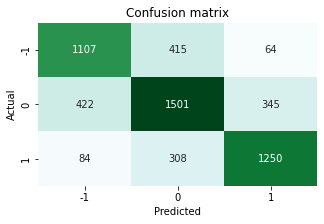

In [258]:
pipe = roBERTa_RF_Pipe


roBERTa_RF_= trainPipelineMlFlow(
                    mlf_XP = "Rapport",
                    xp_name_iter = "roBERTa_RF", 
                    pipeline = pipe, 
                    X_train = X_train, y_train = y_train, X_test = X_val, y_test = y_val,
                    target_col = 'sentiment',
                    fixed_params = target_params(pipe, {'n_jobs':-1,'random_state':42})
                    );

In [259]:
item = pd.DataFrame([['roBERTa_RF_', f1_score(y_val, roBERTa_RF_.predict(X_val), average='macro')]], columns=['modèle', 'f1_macro_val'])

item

,modèle,f1_macro_val
0,roBERTa_RF_,0.705912


In [260]:
résultats = résultats.append(item).sort_values(by='f1_macro_val',ascending=False)
résultats

,modèle,f1_macro_val
0,TfIdf_LR_opti_modif_seuil,0.709477
0,base_TfIdf_RF_prepro_,0.707919
0,base_TfIdf_RF_prepro_opti_,0.706432
0,roBERTa_RF_,0.705912
0,TfIdf_LR_opti_,0.699877
0,TfIdf_LR_prepro_opti_,0.698565
0,base_TfIdf_RF_,0.669789


Sans optimisation, le modèle utilisant roBERTa tweet ne se place qu'en 4ème position, ce qui est en deçà des attentes a priori.

Par ailleurs, la quantité de mémoire vive à disposition sur la carte étant limitée, il n'a pas été possible d'effectuer une optimisation directe du pipeline, celle-ci créant des dépassements de mémoire.

C'est pourquoi la phase de prédiction par roBERTa tweet a été isolée (celle-ci ne présentant par ailleurs aps de possibilité de paramétrage) afin de laisser le seul classifier dans l'optimisation.

#### roBERTa Twitter Sentiment optimisé

In [261]:
import gc

gc.collect()

torch.cuda.empty_cache()


In [179]:
X_train_roBERTa = roBERTa_pipe.transform(X_train)
X_val_roBERTa = roBERTa_pipe.transform(X_val)
X_test_roBERTa = roBERTa_pipe.transform(X_test)

In [237]:
X_train_roBERTa = X_train_roBERTa.set_index(X_train.index)
X_val_roBERTa = X_val_roBERTa.set_index(X_val.index)
X_test_roBERTa = X_test_roBERTa.set_index(X_test.index)
X_train_roBERTa

,roBERTa_neg,roBERTa_neu,roBERTa_pos
0,0.064939,0.808318,0.126744
1,0.918158,0.066100,0.015742
2,0.924613,0.070741,0.004646
3,0.783082,0.192980,0.023938
4,0.564197,0.404574,0.031229
...,...,...,...
21979,0.798430,0.183766,0.017804
21980,0.108279,0.705047,0.186674
21981,0.913698,0.076074,0.010228
21982,0.006624,0.053324,0.940052


In [238]:
X_train_roBERTa.to_parquet('/mnt/data/interim/X_train_roBERTa.gzip',compression='gzip')
X_val_roBERTa.to_parquet('/mnt/data/interim/X_val_roBERTa.gzip',compression='gzip')
X_test_roBERTa.to_parquet('/mnt/data/interim/X_test_roBERTa.gzip',compression='gzip')


In [13]:
X_train_roBERTa = pd.read_parquet('/mnt/data/interim/X_train_roBERTa.gzip')
X_val_roBERTa = pd.read_parquet('/mnt/data/interim/X_val_roBERTa.gzip')
X_test_roBERTa = pd.read_parquet('/mnt/data/interim/X_test_roBERTa.gzip')

![roBERTa_prepro](images/Pipeline_roBERTa_prepro_RF.png)

In [262]:
roBERTa_RF = Pipeline(
    steps=[
        ("classifier", RandomForestClassifier(n_jobs=-1))
    ]
)


XP : roBERTa_RF_opti 

pipeline : 
 RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('classifier',
                                              RandomForestClassifier(n_jobs=-1,
                                                                     random_state=42))]),
                   n_iter=30, n_jobs=-1,
                   param_distributions={'classifier__bootstrap': [True, False],
                                        'classifier__class_weight': ['balanced',
                                                                     None],
                                        'classifier__max_depth': [5, 8, 15, 25,
                                                                  30],
                                        'classifier__min_samples_leaf': [1, 2,
                                                                         5,
                                                                         10],
                                        'classi

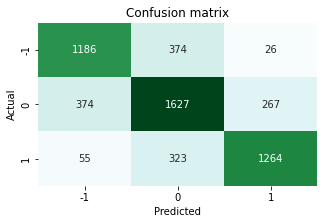

In [263]:
pipe = roBERTa_RF

params = target_params(pipe, {
    "bootstrap": [True, False],
    "class_weight": ["balanced", None],
    "n_estimators": [100, 300, 500, 800, 1200],
    "max_depth": [5, 8, 15, 25, 30],
    "min_samples_split": [2, 5, 10, 15, 100],
    "min_samples_leaf": [1, 2, 5, 10]
})


roBERTa_RF_opti_ = trainPipelineMlFlow(
                    mlf_XP = "Rapport",
                    xp_name_iter="roBERTa_RF_opti", 
                    pipeline = pipe, 
                    X_train = X_train_roBERTa, y_train = y_train, X_test = X_val_roBERTa, y_test = y_val,
                    target_col = 'sentiment',
                    fixed_params = target_params(pipe, {'n_jobs':-1,'random_state':42}),
                    use_opti = True,
                    iterable_params=params,
                    n_iter=30
                    );

Le modèle, une fois optimisé, arrive en haut du classement avec un gain de persque **+4%** de f1 pour atteindre **74,66%** sur le jeu de validation

In [264]:
item = pd.DataFrame([['roBERTa_RF_opti_', f1_score(y_val, roBERTa_RF_opti_.predict(X_val_roBERTa), average='macro')]], columns=['modèle', 'f1_macro_val'])

item

,modèle,f1_macro_val
0,roBERTa_RF_opti_,0.74663


In [265]:
résultats = résultats.append(item).sort_values(by='f1_macro_val',ascending=False)
résultats

,modèle,f1_macro_val
0,roBERTa_RF_opti_,0.746630
0,TfIdf_LR_opti_modif_seuil,0.709477
0,base_TfIdf_RF_prepro_,0.707919
0,base_TfIdf_RF_prepro_opti_,0.706432
0,roBERTa_RF_,0.705912
0,TfIdf_LR_opti_,0.699877
0,TfIdf_LR_prepro_opti_,0.698565
0,base_TfIdf_RF_,0.669789


#### Essai combinaison de différentes méthodes

Afin de gagner encore en performance, il est possible de combiner plusieurs outils d'estimation de sentimenst a priori. Ces transformations ne relevant pas des mêmes stratégies, elles capturent des éléments légèrement différents.

Les méthodes sélectionnées ici pour leur simplicité d'utilisation sont :
- [TextBlob](https://textblob.readthedocs.io/en/dev/quickstart.html)
- [Vader](http://comp.social.gatech.edu/papers/icwsm14.vader.hutto.pdf)

![roBERTa_Blob_Vader](images/Pipeline_roBERTa_Blob_Vader_prepro_RF.png)



In [266]:
class Blob(BaseEstimator, TransformerMixin):
    def __init__(self, field):
        self.field = field
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        X[['polarity', 'subjectivity']] =  X[self.field].apply(lambda x:TextBlob(x).sentiment).apply(pd.Series)
        return X[['polarity', 'subjectivity']]

In [187]:
blob_pipe=Pipeline([
                     ('blob', Blob(field='text'))
                    ])

In [188]:
X_train_Blob=blob_pipe.transform(X_train)
X_val_Blob=blob_pipe.transform(X_val)
X_test_Blob=blob_pipe.transform(X_test)

In [189]:
X_train_Blob.head()

,polarity,subjectivity
0,0.000000,0.0
1,-0.976562,1.0
2,0.000000,0.0
3,0.000000,0.0
4,0.000000,0.0


In [190]:
X_train_Blob.to_parquet('/mnt/data/interim/X_train_Blob.gzip',compression='gzip')
X_val_Blob.to_parquet('/mnt/data/interim/X_val_Blob.gzip',compression='gzip')
X_test_Blob.to_parquet('/mnt/data/interim/X_test_Blob.gzip',compression='gzip')

In [267]:
X_train_Blob = pd.read_parquet('/mnt/data/interim/X_train_Blob.gzip')
X_val_Blob = pd.read_parquet('/mnt/data/interim/X_val_Blob.gzip')
X_test_Blob = pd.read_parquet('/mnt/data/interim/X_test_Blob.gzip')

On vérifie que TextBlob et roBERTa ne capturent pas les mêmes éléments.

TextBlob fournissant un indicateur global, on approxime les sentiments de rBERTa comme `positive` - `negative`

In [268]:
X =pd.DataFrame(columns=['roBERTa_sent'])
X['roBERTa_sent'] = X_train_roBERTa['roBERTa_pos']- X_train_roBERTa['roBERTa_neg']
X2 = pd.concat([X, X_train_Blob[['polarity']]], axis=1)
X2.corr()


,roBERTa_sent,polarity
roBERTa_sent,1.000000,0.563574
polarity,0.563574,1.000000


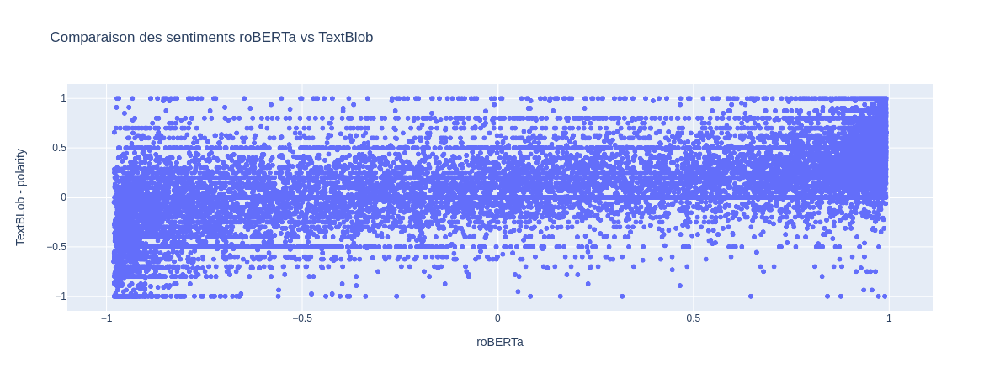

In [269]:
fig = px.scatter(x = X_train_roBERTa['roBERTa_pos']- X_train_roBERTa['roBERTa_neg'], 
                 y = X_train_Blob['polarity'],
                labels = {
                     'x': 'roBERTa',
                     'y' : 'TextBLob - polarity',
                 },
                title = 'Comparaison des sentiments roBERTa vs TextBlob')
fig.show()

In [270]:
class Vader(BaseEstimator, TransformerMixin):
    def __init__(self, field):
        self.field = field
        sid = SentimentIntensityAnalyzer()
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        sid = SentimentIntensityAnalyzer()
        X[['neg', 'neu', 'pos', 'compound']] =  X[self.field].apply(sid.polarity_scores).apply(pd.Series)
        return X[['neg', 'neu', 'pos', 'compound']]

In [208]:
vader_pipe=Pipeline([
                     ('vader', Vader(field='text'))
                    ])

In [209]:
X_train_Vader=vader_pipe.transform(X_train)
X_val_Vader=vader_pipe.transform(X_val)
X_test_Vader=vader_pipe.transform(X_test)

In [210]:
X_train_Vader.head()

,neg,neu,pos,compound
0,0.000,1.000,0.0,0.0000
1,0.474,0.526,0.0,-0.7437
2,0.494,0.506,0.0,-0.5994
3,0.538,0.462,0.0,-0.3595
4,0.000,1.000,0.0,0.0000


In [211]:
X_train_Vader.to_parquet('/mnt/data/interim/X_train_Vader.gzip',compression='gzip')
X_val_Vader.to_parquet('/mnt/data/interim/X_val_Vader.gzip',compression='gzip')
X_test_Vader.to_parquet('/mnt/data/interim/X_test_Vader.gzip',compression='gzip')

In [271]:
X_train_Vader = pd.read_parquet('/mnt/data/interim/X_train_Vader.gzip')
X_val_Vader = pd.read_parquet('/mnt/data/interim/X_val_Vader.gzip')
X_test_Vader = pd.read_parquet('/mnt/data/interim/X_test_Vader.gzip')

On vérifie de la même manière que Vader et roBERTa ne capturent pas les mêmes éléments.

Pour les positifs

In [272]:
X_pos = pd.concat([X_train_roBERTa[['roBERTa_pos']], X_train_Vader[['pos']]], axis=1)
X_pos.corr()


,roBERTa_pos,pos
roBERTa_pos,1.000000,0.607805
pos,0.607805,1.000000


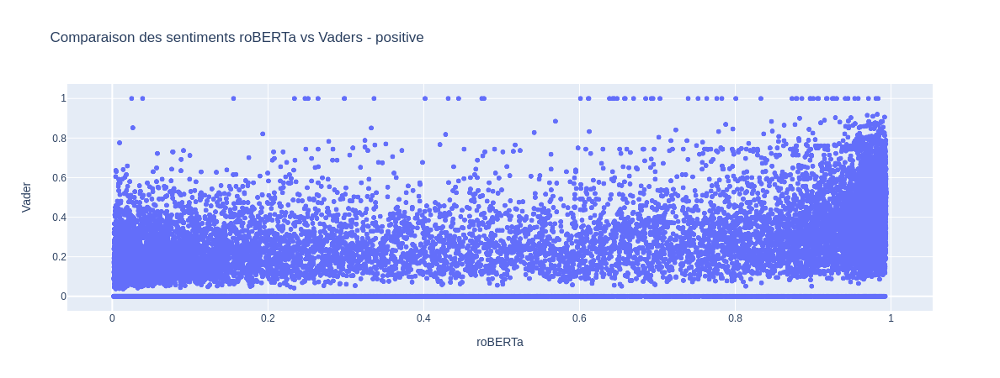

In [273]:
fig = px.scatter(x = X_train_roBERTa['roBERTa_pos'], 
                 y = X_train_Vader['pos'],
                labels = {
                     'x': 'roBERTa',
                     'y' : 'Vader',
                 },
                title = 'Comparaison des sentiments roBERTa vs Vaders - positive')
fig.show()

Pour les neutres

In [274]:
X_pos = pd.concat([X_train_roBERTa[['roBERTa_neu']], X_train_Vader[['neu']]], axis=1)
X_pos.corr()


,roBERTa_neu,neu
roBERTa_neu,1.000000,0.473356
neu,0.473356,1.000000


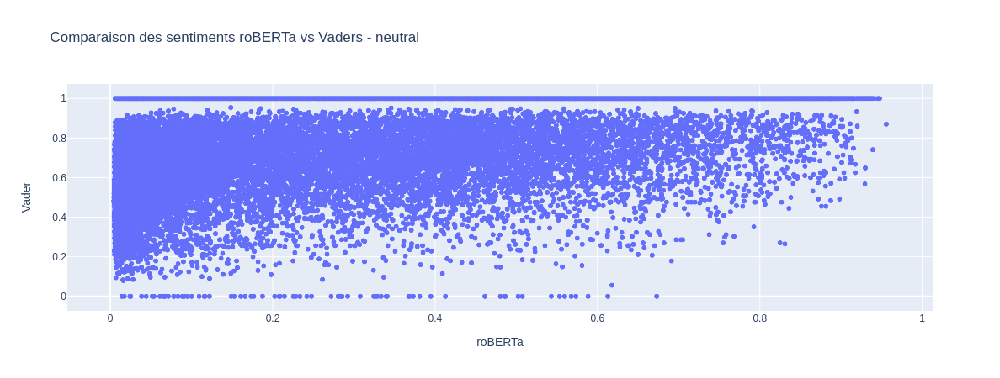

In [275]:
fig = px.scatter(x = X_train_roBERTa['roBERTa_neu'], 
                 y = X_train_Vader['neu'],
                labels = {
                     'x': 'roBERTa',
                     'y' : 'Vader',
                 },
                title = 'Comparaison des sentiments roBERTa vs Vaders - neutral')
fig.show()

Pour les négatifs

In [276]:
X_pos = pd.concat([X_train_roBERTa[['roBERTa_neg']], X_train_Vader[['neg']]], axis=1)
X_pos.corr()


,roBERTa_neg,neg
roBERTa_neg,1.000000,0.560029
neg,0.560029,1.000000


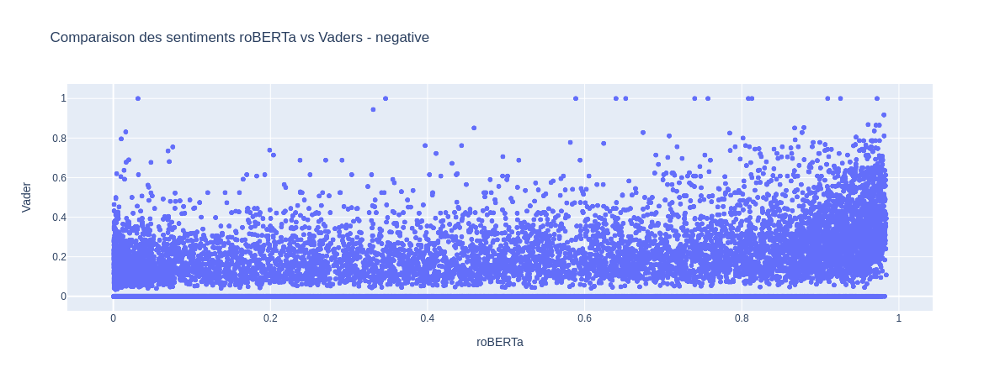

In [277]:
fig = px.scatter(x = X_train_roBERTa['roBERTa_neg'], 
                 y = X_train_Vader['neg'],
                labels = {
                     'x': 'roBERTa',
                     'y' : 'Vader',
                 },
                title = 'Comparaison des sentiments roBERTa vs Vaders - negative')
fig.show()

On peut alors calculer la base agrégée

In [278]:
X_train_compound = pd.concat([X_train_roBERTa, X_train_Blob, X_train_Vader], axis=1)
X_val_compound = pd.concat([X_val_roBERTa, X_val_Blob, X_val_Vader], axis=1)
X_test_compound = pd.concat([X_test_roBERTa, X_test_Blob, X_test_Vader], axis=1)


In [15]:
X_train_compound.head()

,roBERTa_neg,roBERTa_neu,roBERTa_pos,polarity,subjectivity,neg,neu,pos,compound
0,0.064939,0.808318,0.126744,0.000000,0.0,0.000,1.000,0.0,0.0000
1,0.918158,0.066100,0.015742,-0.976562,1.0,0.474,0.526,0.0,-0.7437
2,0.924613,0.070741,0.004646,0.000000,0.0,0.494,0.506,0.0,-0.5994
3,0.783082,0.192980,0.023938,0.000000,0.0,0.538,0.462,0.0,-0.3595
4,0.564197,0.404574,0.031229,0.000000,0.0,0.000,1.000,0.0,0.0000


In [16]:
X_val_compound.head()

,roBERTa_neg,roBERTa_neu,roBERTa_pos,polarity,subjectivity,neg,neu,pos,compound
21984,0.562985,0.367200,0.069815,0.0,0.0000,0.211,0.789,0.000,-0.1531
21985,0.226580,0.667382,0.106038,0.0,0.0000,0.000,1.000,0.000,0.0000
21986,0.002332,0.476234,0.521434,0.0,0.0000,0.000,1.000,0.000,0.0000
21987,0.296688,0.569384,0.133927,0.0,0.0000,0.000,0.799,0.201,0.7003
21988,0.004010,0.177016,0.818974,0.4,0.5125,0.000,0.864,0.136,0.4588


:::{tip}
Comme on travaille avec des arbres il n'y a pas besoin de renormer / standardiser les différentes colonnes
:::

XP : roBERTa_Blob_Vader_RF_opti 

pipeline : 
 RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('classifier',
                                              RandomForestClassifier(n_jobs=-1,
                                                                     random_state=42))]),
                   n_iter=30, n_jobs=-1,
                   param_distributions={'classifier__bootstrap': [True, False],
                                        'classifier__class_weight': ['balanced',
                                                                     None],
                                        'classifier__max_depth': [5, 8, 15, 25,
                                                                  30],
                                        'classifier__min_samples_leaf': [1, 2,
                                                                         5,
                                                                         10],
                                    

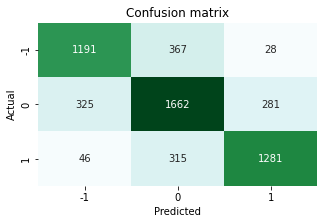

In [279]:
pipe = roBERTa_RF

params = target_params(pipe, {
    "bootstrap": [True, False],
    "class_weight": ["balanced", None],
    "n_estimators": [100, 300, 500, 800, 1200],
    "max_depth": [5, 8, 15, 25, 30],
    "min_samples_split": [2, 5, 10, 15, 100],
    "min_samples_leaf": [1, 2, 5, 10]
})


roBERTa_Blob_Vader_RF_opti_ = trainPipelineMlFlow(
                                    mlf_XP="Rapport",
                                    xp_name_iter="roBERTa_Blob_Vader_RF_opti", 
                                    pipeline = pipe, 
                                    X_train = X_train_compound, y_train = y_train, X_test = X_val_compound, y_test = y_val,
                                    target_col = 'sentiment',
                                    fixed_params = target_params(pipe, {'n_jobs':-1,'random_state':42}),
                                    use_opti = True,
                                    iterable_params = params,
                                    n_iter = 30
                                    );

In [280]:
item = pd.DataFrame([['roBERTa_Blob_Vader_RF_opti_', f1_score(y_val, roBERTa_Blob_Vader_RF_opti_.predict(X_val_compound), average='macro')]], columns=['modèle', 'f1_macro_val'])

item

,modèle,f1_macro_val
0,roBERTa_Blob_Vader_RF_opti_,0.756699


In [281]:
résultats = résultats.append(item).sort_values(by='f1_macro_val',ascending=False)
résultats

,modèle,f1_macro_val
0,roBERTa_Blob_Vader_RF_opti_,0.756699
0,roBERTa_RF_opti_,0.746630
0,TfIdf_LR_opti_modif_seuil,0.709477
0,base_TfIdf_RF_prepro_,0.707919
0,base_TfIdf_RF_prepro_opti_,0.706432
0,roBERTa_RF_,0.705912
0,TfIdf_LR_opti_,0.699877
0,TfIdf_LR_prepro_opti_,0.698565
0,base_TfIdf_RF_,0.669789


:::{note}
L'utilisation de Vader et Blob en soutien de roBERTa a permi de gagner 1 point de f1 sur le jeu de validation         
:::

### Essai xgboost sur combinaison de méthodes

Dans ce dernier essai on remplace le RandomClassifier par un XGBoost

![xgb](images/Pipeline_roBERTa_Blob_Vader_prepro_xgb.png)


In [282]:
import xgboost as xgb

In [18]:
roBERTa_xgb = Pipeline(
    steps=[
        ("classifier", xgb.XGBClassifier())
    ]
)

:::{tip}
Dans l'exemple ci-dessous on utilise explicitement le GPU pour accélérer les calculs (`tree_method = 'gpu_hist'` et `gpu_id=0`) .
Le gain est saisissant : dans une première version qui n'utilisait que le CPU, le modèle tournait en 3h30, contre un peu plus de 4 min ici, soit un gain de temps de presque 1:52!
:::

[03:37:26] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
XP : roBERTa - xgb - opti 

pipeline : 
 RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('classifier',
                                              XGBClassifier(base_score=None,
                                                            booster=None,
                                                            colsample_bylevel=None,
                                                            colsample_bynode=None,
                                                            colsample_bytree=None,
                                                            gamma=None,
                                                            gpu_id=0,
                                                            importance_type='g

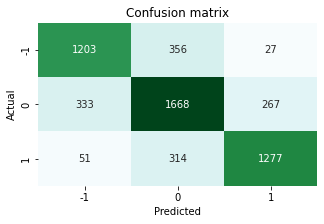

In [19]:
pipe = roBERTa_xgb

params = target_params(pipe, {
     "eta"    : [0.05, 0.10, 0.15, 0.20, 0.25, 0.30 ] ,
     "max_depth"        : [ 3, 4, 5, 6, 8, 10, 12, 15],
     "min_child_weight" : [ 1, 3, 5, 7 ],
     "gamma"            : [ 0.0, 0.1, 0.2 , 0.3, 0.4 ],
     "colsample_bytree" : [ 0.3, 0.4, 0.5 , 0.7 ]
     })


roBERTa_xgb_opti_ = trainPipelineMlFlow(
                    mlf_XP="DSA_Tweets",
                    xp_name_iter="roBERTa - xgb - opti", 
                    pipeline = pipe, 
                    X_train = X_train_compound, y_train = y_train, X_test = X_val_compound, y_test = y_val,
                    target_col = 'sentiment',
                    fixed_params = target_params(pipe, {'n_jobs':-1,'random_state':42, 'gpu_id':0, 'tree_method' : 'gpu_hist'}),
                    use_opti = True,
                    iterable_params=params,
                    n_iter=20
                    )

On essaye de comprendre les 27 tweets négatifs qui ont été prédits positifs

Le modèle XGBoost optimisé à partir des données augmenté se hisse à la première place du podium

In [286]:
item = pd.DataFrame([['roBERTa_xgb_opti_', f1_score(y_val, roBERTa_xgb_opti_.predict(X_val_compound), average='macro')]], columns=['modèle', 'f1_macro_val'])

item

,modèle,f1_macro_val
0,roBERTa_xgb_opti_,0.759147


In [287]:
résultats = résultats.append(item).sort_values(by='f1_macro_val',ascending=False)
résultats

,modèle,f1_macro_val
0,roBERTa_xgb_opti_,0.759147
0,roBERTa_Blob_Vader_RF_opti_,0.756699
0,roBERTa_RF_opti_,0.746630
0,TfIdf_LR_opti_modif_seuil,0.709477
0,base_TfIdf_RF_prepro_,0.707919
0,base_TfIdf_RF_prepro_opti_,0.706432
0,roBERTa_RF_,0.705912
0,TfIdf_LR_opti_,0.699877
0,TfIdf_LR_prepro_opti_,0.698565
0,base_TfIdf_RF_,0.669789


In [288]:
résultats_fin = résultats

In [289]:
résultats_fin


,modèle,f1_macro_val
0,roBERTa_xgb_opti_,0.759147
0,roBERTa_Blob_Vader_RF_opti_,0.756699
0,roBERTa_RF_opti_,0.746630
0,TfIdf_LR_opti_modif_seuil,0.709477
0,base_TfIdf_RF_prepro_,0.707919
0,base_TfIdf_RF_prepro_opti_,0.706432
0,roBERTa_RF_,0.705912
0,TfIdf_LR_opti_,0.699877
0,TfIdf_LR_prepro_opti_,0.698565
0,base_TfIdf_RF_,0.669789


On peut s'interroger sur les prédiction restantes qui sont positives, mais classées comme négatives et inversement

In [290]:
y_val_pred = roBERTa_xgb_opti_.predict(X_val_compound)
inpt = pd.concat([X_val, X_val_compound], axis=1)

In [293]:
exemples_realNeg_predPos_fin = inpt[(y_val['sentiment']==-1) & (y_val_pred==1)]
exemples_realPos_predNeg_fin = inpt[(y_val['sentiment']==1) & (y_val_pred==-1)]

In [294]:
exemples_realNeg_predPos_fin

,text,roBERTa_neg,roBERTa_neu,roBERTa_pos,polarity,subjectivity,neg,neu,pos,compound
22095,"Omg I want TF2, everybody on my Steam Friends list is playing it",0.001319,0.039033,0.959648,0.000000,0.000000,0.000,0.592,0.408,0.6369
22222,"Hi, my name is Kate and I`m addicted to mm`s!",0.009058,0.103601,0.887340,-0.500000,0.600000,0.000,1.000,0.000,0.0000
22424,"I miss my dog r.i.p.Batman... Yeah, Batman (I really hope `all dogs go to heaven` is true)",0.073255,0.355204,0.571541,0.275000,0.425000,0.080,0.650,0.270,0.5849
22498,"My storm is acting up ....Excited for the discussion session regarding Social Media. Scott Lake, CEO of ThinkSM, will be attending.",0.000800,0.013065,0.986135,0.016667,0.033333,0.000,1.000,0.000,0.0000
23387,it`s ridiculously warm in bed,0.003796,0.075537,0.920667,0.600000,0.600000,0.329,0.411,0.260,-0.1280
23874,i want to see my bud mel miss hur loads,0.084246,0.431542,0.484211,0.000000,0.000000,0.162,0.707,0.131,-0.0772
23932,and this is better 4 me than a snickers bar or hersheys w/almonds.... which i use to b addicted to b4. i miss them LOL,0.029847,0.111354,0.858799,0.300000,0.600000,0.064,0.679,0.257,0.7034
24100,AHHHHHHH!!!!! its my 16th birthday And i cant belive i found out im seeing yous tonight Best present everr!!! <333333333,0.001637,0.006869,0.991494,0.500000,0.150000,0.000,0.760,0.240,0.7482
24443,Hav fun at heav y Metal happy hour you guys! In the future accadentally sets it on fire while smoking with,0.002921,0.033595,0.963485,0.433333,0.441667,0.090,0.637,0.273,0.7088
24468,So glad the days almost over... Another nite of me nd my pain pills alone at the crib lol. Ughh I wish this weekend was over alreadi!,0.038555,0.112199,0.849246,0.750000,0.850000,0.150,0.593,0.257,0.5838


Contrairement à la première analyse, on observe que le taux de tweets vraisemblablement mal libellés semble plus important

In [314]:
exemples_realPos_predNeg_fin

,text,roBERTa_neg,roBERTa_neu,roBERTa_pos,polarity,subjectivity,neg,neu,pos,compound
22162,"I wish I can see that. They have CNN here again, with no volume.",0.634638,0.326405,0.038957,0.000000,0.000000,0.148,0.671,0.181,0.1280
22281,_22 ok so I`m having a complete insomniac moment. It`s 6am(almost) and I`m STILL awake. I hate when I can`t stop thinking! mornin!,0.929382,0.059761,0.010857,-0.133333,0.600000,0.252,0.662,0.086,-0.6467
22404,i hope my morning show doesn`t get cancelled!,0.548575,0.370015,0.081410,0.000000,0.000000,0.196,0.491,0.313,0.2942
22630,"let me guess ... ran a few miles? Respect dude, I can`t do it. Maybe you should train me",0.712335,0.261885,0.025779,-0.200000,0.100000,0.000,0.838,0.162,0.4767
22807,Why don`t we close the library due to the great weather? And the ac isn`t working #fb,0.701326,0.255291,0.043382,0.337500,0.562500,0.000,0.796,0.204,0.6249
22817,Why do you hurt me? Does it bring you joy to see me cry? You know I love you more then anything and yet u break my heart everyday!,0.929708,0.057478,0.012813,0.387500,0.475000,0.170,0.603,0.227,0.4857
23044,"Big Laptop is too big, so it`s time to switch to the Eee. Bye big guy",0.590308,0.326236,0.083455,0.000000,0.100000,0.000,1.000,0.000,0.0000
23281,Aww just read your tweet. I`m not sure about later either (work too) feel it for us,0.577661,0.382728,0.039611,0.016667,0.596296,0.109,0.891,0.000,-0.2411
23308,My palms are itchy. Doesn`t that mean something about coming into a great deal of money?,0.598176,0.352266,0.049558,0.243750,0.718750,0.109,0.677,0.214,0.4588
23402,"Good morning I don`t think it has stopped raining once for the past three days or so, but who cares?",0.287069,0.541327,0.171604,0.225000,0.425000,0.061,0.672,0.267,0.7092


On peut essayer de comprendre comment le modèle exploite les informations fournies pour prendre ses décisions en s'appuyant sur SHAP

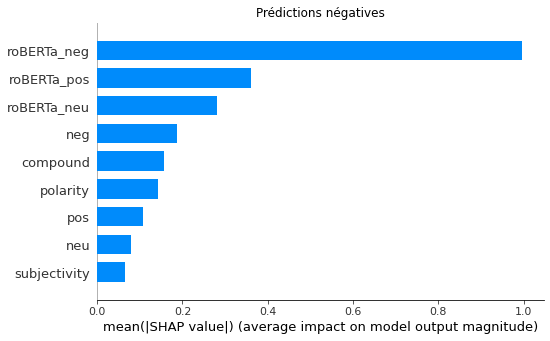

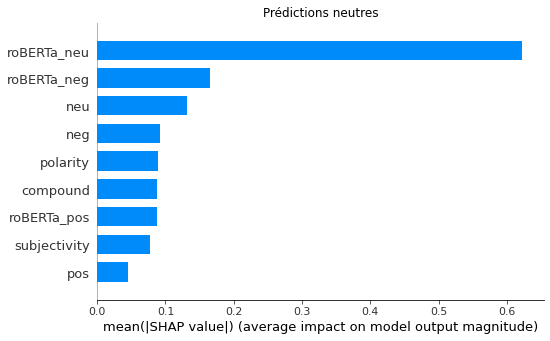

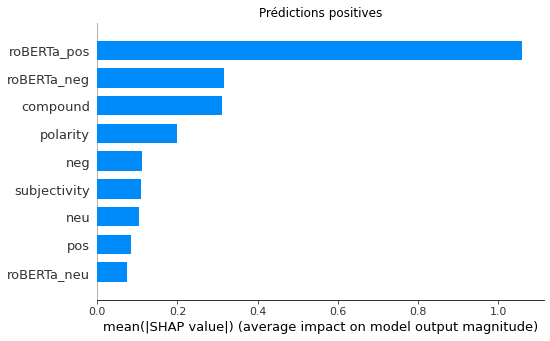

In [315]:
#set the tree explainer as the model of the pipeline
explainer = shap.TreeExplainer(roBERTa_xgb_opti_.best_estimator_['classifier'])

#apply the preprocessing to x_test
#observations = pipeline['imputer'].transform(x_test)
observations = X_val_compound

#get Shap values from preprocessed data
shap_values = explainer.shap_values(observations)

#plot the feature importance
titres = {0 : 'Prédictions négatives', 1: 'Prédictions neutres', 2 : 'Prédictions positives'}
for i in range(3):
    shap.summary_plot(shap_values[i], observations, plot_type="bar", show=False)
    plt.title(titres[i])
    plt.show()
    

:::{tip}
Cette première analyse confirme que le modèle s'appuie principalement sur les prédiction de roBERTa tweet de la classification idoine pour prendre sa décision. Les autres composantes ayant des contributions bien plus faibles. 
:::

On peut ensuite zoomer sur la manière dont les prédictions de roBERTa sont prises en compte dans le modèle :

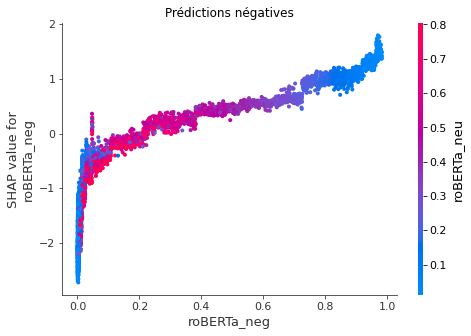

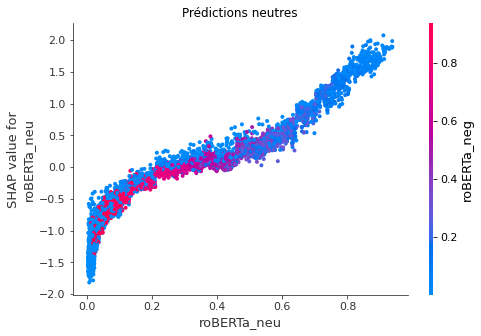

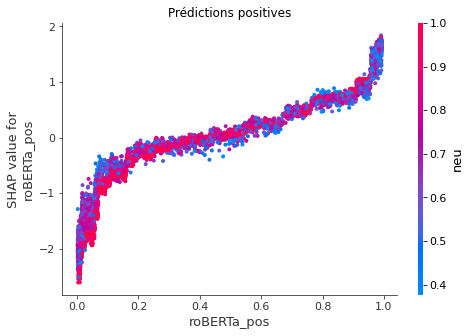

In [316]:
titres = {0 : 'Prédictions négatives', 1: 'Prédictions neutres', 2 : 'Prédictions positives'}
axe = {0 : 'roBERTa_neg', 1: 'roBERTa_neu', 2 : 'roBERTa_pos'}
for i in range(3):
    shap.dependence_plot(axe[i], shap_values[i], X_val_compound, show=False)
    plt.title(titres[i])
    plt.show()


## Soumission finale

On réentraine les 2 modèles finalistes sur le jeu de validation sur l'intégralité de `tain + val` et on évalue sur le jeu de test

:::{warning}
Ici on réajuste uniquement les modèles sans explorer de nouvelles vvaleur d'hyperparamètres
:::

In [317]:
y_train_tot = pd.concat([y_train, y_val], axis=0)

In [318]:
X_train_compound_tot = pd.concat([X_train_compound, X_val_compound], axis=0)

In [32]:
X_train_compound_tot

,roBERTa_neg,roBERTa_neu,roBERTa_pos,polarity,subjectivity,neg,neu,pos,compound
0,0.064939,0.808318,0.126744,0.000000,0.000000,0.000,1.000,0.000,0.0000
1,0.918158,0.066100,0.015742,-0.976562,1.000000,0.474,0.526,0.000,-0.7437
2,0.924613,0.070741,0.004646,0.000000,0.000000,0.494,0.506,0.000,-0.5994
3,0.783082,0.192980,0.023938,0.000000,0.000000,0.538,0.462,0.000,-0.3595
4,0.564197,0.404574,0.031229,0.000000,0.000000,0.000,1.000,0.000,0.0000
...,...,...,...,...,...,...,...,...,...
27475,0.434403,0.445122,0.120474,0.000000,0.000000,0.128,0.722,0.150,0.1027
27476,0.139542,0.635024,0.225433,0.184091,0.646970,0.000,0.890,0.110,0.3818
27477,0.003337,0.022629,0.974034,0.366667,0.533333,0.000,0.572,0.428,0.9136
27478,0.053331,0.357756,0.588913,0.300000,0.100000,0.000,0.680,0.320,0.3291


XP : roBERTa_Blob_Vader_RF_opti_tot 

pipeline : 
 Pipeline(steps=[('classifier',
                 RandomForestClassifier(n_estimators=500, n_jobs=-1,
                                        random_state=42))]) 

params: 
 {'classifier__n_jobs': -1, 'classifier__random_state': 42, 'classifier__n_estimators': 500} 

scores : 
 subset           train    test
metric                        
f1_macro           1.0  0.7502
precision_macro    1.0  0.7504
recall_macro       1.0  0.7503 

Test confusion matrix: 

elapsed time : 0:00:03.972592


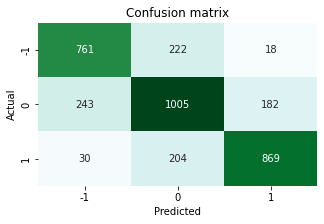

In [320]:
pipe = roBERTa_RF

params = target_params(pipe, {
    'n_jobs':-1,
    'random_state':42,
    'n_estimators': 500, 
    'classifier__min_samples_split': 15, 
    'classifier__min_samples_leaf': 10, 
    'classifier__max_depth': 15, 
    'classifier__class_weight': None, 
    'classifier__bootstrap': True
})


roBERTa_Blob_Vader_RF_opti_tot_ = trainPipelineMlFlow(
                                        mlf_XP="Rapport",
                                        xp_name_iter="roBERTa_Blob_Vader_RF_opti_tot", 
                                        pipeline = pipe, 
                                        X_train = X_train_compound_tot, y_train = y_train_tot, X_test = X_test_compound, y_test = y_test,
                                        target_col = 'sentiment',
                                        fixed_params = params,
                                        use_opti = False,
                                        );

In [321]:
item = pd.DataFrame([['roBERTa_Blob_Vader_RF_opti_', f1_score(y_test, roBERTa_Blob_Vader_RF_opti_tot_.predict(X_test_compound), average='macro')]], columns=['modèle', 'f1_macro_test'])

item

,modèle,f1_macro_test
0,roBERTa_Blob_Vader_RF_opti_,0.750216


In [322]:
res_fin=item

[10:22:08] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
XP : roBERTa_xgb_opti_tot 

pipeline : 
 Pipeline(steps=[('classifier',
                 XGBClassifier(base_score=0.5, booster='gbtree',
                               colsample_bylevel=1, colsample_bynode=1,
                               colsample_bytree=1, gamma=0, gpu_id=0,
                               importance_type='gain',
                               interaction_constraints='',
                               learning_rate=0.300000012, max_delta_step=0,
                               max_depth=6, min_child_weight=1, missing=nan,
                               monotone_constraints='()', n_estimators=100,
                               n_jobs=-1, num_parallel_tree=1,
                               objective='multi:softprob', ran

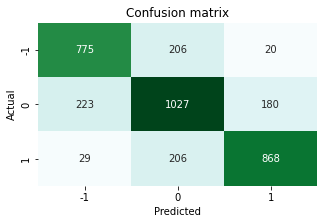

In [323]:
pipe = roBERTa_xgb

params = target_params(pipe, {
                'classifier__n_jobs': -1, 
                'classifier__random_state': 42, 
                'classifier__gpu_id': 0, 
                'classifier__tree_method': 'gpu_hist', 
                'classifier__min_child_weight': 7, 
                'classifier__max_depth': 5, 
                'classifier__gamma': 0.1, 
                'classifier__colsample_bytree': 0.7
     })


roBERTa_xgb_opti_tot_ = trainPipelineMlFlow(
                    mlf_XP="Rapport",
                    xp_name_iter="roBERTa_xgb_opti_tot", 
                    pipeline = pipe, 
                    X_train = X_train_compound_tot, y_train = y_train_tot, X_test = X_test_compound, y_test = y_test,
                    target_col = 'sentiment',
                    fixed_params = params,
                    use_opti = False
                    );

In [324]:
item = pd.DataFrame([['roBERTa_xgb_opti_', f1_score(y_test, roBERTa_xgb_opti_tot_.predict(X_test_compound), average='macro')]], columns=['modèle', 'f1_macro_test'])

item

,modèle,f1_macro_test
0,roBERTa_xgb_opti_,0.759953


In [325]:
res_fin=res_fin.append(item)

In [326]:
res_fin2=pd.merge(résultats, res_fin, how='left', on='modèle')
res_fin2

,modèle,f1_macro_val,f1_macro_test
0,roBERTa_xgb_opti_,0.759147,0.759953
1,roBERTa_Blob_Vader_RF_opti_,0.756699,0.750216
2,roBERTa_RF_opti_,0.746630,NaN
3,TfIdf_LR_opti_modif_seuil,0.709477,NaN
4,base_TfIdf_RF_prepro_,0.707919,NaN
5,base_TfIdf_RF_prepro_opti_,0.706432,NaN
6,roBERTa_RF_,0.705912,NaN
7,TfIdf_LR_opti_,0.699877,NaN
8,TfIdf_LR_prepro_opti_,0.698565,NaN
9,base_TfIdf_RF_,0.669789,NaN


In [327]:
résultats.to_parquet('/mnt/data/processed/résultats.gzip',compression='gzip')
res_fin.to_parquet('/mnt/data/processed/res_fin.gzip',compression='gzip')
res_fin2.to_parquet('/mnt/data/processed/res_fin2.gzip',compression='gzip')

:::{note}
Le modèle final présente un f1 macro de **0.76** sur le jeu de test.

Les résultats sont en ligne avec ceux obtenus sur le jeu de validation. Néanmoins le fait de ne pas avoir regarder les résultats sur le jeu de test avant cette étape assure que nous n'avons pas pu faire de leakage d'une manière ou d'une autre. Cette démarche émule aussi celle qui existerait dans un cas industriel où une équipe séparée serait en charge de définir un jeu de test permettant de tester le modèle dans des conditions dégradées par rapport à son domaine d'entraînement pour en assurer la stabilité en production.
:::